### What is done in this notebook
- EDA of two dataset(6months mainly)
  `air3m_join_stations_0308`
  `air6m_join_stations_0308`

### Reference
 - **Discussion of features(keep/drop)**
   - https://docs.google.com/spreadsheets/d/1wFra4oo6wdiy23kbUswi-f44yeCXxId_3uHuLfTqSvs/edit?usp=sharing
 
 - Screen shot of data profile(distribution of each feature)
   - https://docs.google.com/document/d/1ZEj5TNxJNUzT-8MExU399fN4z5IQU5HDOSv-AgbAvmA/edit?usp=sharing

# 0. Preparation

In [0]:
# Put at the top of any notebooks for storing in blob

from pyspark.sql.functions import col, max

blob_container = "team06" # The name of your container created in https://portal.azure.com
storage_account = "apatel" # The name of your Storage account created in https://portal.azure.com
secret_scope = "team06" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "team06" # The name of the secret key created in your local computer using the Databricks CLI 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

In [0]:
!pip install geopandas
!conda install python=3 geopandas
!conda install descartes
!conda install mapclassify
!conda install contextily
!pip install folium

Requirement already satisfied: geopandas in /databricks/python3/lib/python3.8/site-packages (0.10.2)
Requirement already satisfied: fiona>=1.8 in /databricks/python3/lib/python3.8/site-packages (from geopandas) (1.8.21)
Requirement already satisfied: shapely>=1.6 in /databricks/python3/lib/python3.8/site-packages (from geopandas) (1.8.1.post1)
Requirement already satisfied: pyproj>=2.2.0 in /databricks/python3/lib/python3.8/site-packages (from geopandas) (3.3.0)
Requirement already satisfied: pandas>=0.25.0 in /databricks/python3/lib/python3.8/site-packages (from geopandas) (1.2.4)
Requirement already satisfied: six>=1.7 in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (1.15.0)
Requirement already satisfied: setuptools in /usr/local/lib/python3.8/dist-packages (from fiona>=1.8->geopandas) (52.0.0)
Requirement already satisfied: click>=4.0 in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (8.1.1)
Requirement already satisfied: certifi in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (2020.12.5)
Requirement already satisfied: munch in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (2.5.0)
Requirement already satisfied: cligj>=0.5 in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (0.7.2)
Requirement already satisfied: click-plugins>=1.0 in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (1.1.1)
Requirement already satisfied: attrs>=17 in /databricks/python3/lib/python3.8/site-packages (from fiona>=1.8->geopandas) (20.3.0)
Requirement already satisfied: pytz>=2017.3 in /databricks/python3/lib/python3.8/site-packages (from pandas>=0.25.0->geopandas) (2020.5)
Requirement already satisfied: numpy>=1.16.5 in /databricks/python3/lib/python3.8/site-packages (from pandas>=0.25.0->geopandas) (1.19.2)
Requirement already satisfied: python-dateutil>=2.7.3 in /databricks/python3/lib/python3.8/site-packages (from pandas>=0.25.0->geopandas) (2.8.1)
/bin/bash: conda: command not found
/bin/bash: conda: command not found
/bin/bash: conda: command not found
/bin/bash: conda: command not found
Requirement already satisfied: folium in /databricks/python3/lib/python3.8/site-packages (0.12.1.post1)
Requirement already satisfied: branca>=0.3.0 in /databricks/python3/lib/python3.8/site-packages (from folium) (0.4.2)
Requirement already satisfied: requests in /databricks/python3/lib/python3.8/site-packages (from folium) (2.25.1)
Requirement already satisfied: numpy in /databricks/python3/lib/python3.8/site-packages (from folium) (1.19.2)
Requirement already satisfied: jinja2>=2.9 in /databricks/python3/lib/python3.8/site-packages (from folium) (2.11.3)
Requirement already satisfied: MarkupSafe>=0.23 in /databricks/python3/lib/python3.8/site-packages (from jinja2>=2.9->folium) (1.1.1)
Requirement already satisfied: certifi>=2017.4.17 in /databricks/python3/lib/python3.8/site-packages (from requests->folium) (2020.12.5)
Requirement already satisfied: chardet<5,>=3.0.2 in /databricks/python3/lib/python3.8/site-packages (from requests->folium) (4.0.0)
Requirement already satisfied: urllib3<1.27,>=1.21.1 in /databricks/python3/lib/python3.8/site-packages (from requests->folium) (1.25.11)
Requirement already satisfied: idna<3,>=2.5 in /databricks/python3/lib/python3.8/site-packages (from requests->folium) (2.10)

In [0]:
from pyspark.sql.functions import col
import pandas as pd
import numpy as np
import os

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import ast

import geopandas as gpd
import folium


In [0]:

df_airlines_3m = spark.read.parquet(f'{blob_url}/air3m_join_stations_0316')
df_airlines_6m = spark.read.parquet(f'{blob_url}/air6m_join_stations_0316')
df_nearest_stations_v3 = spark.read.parquet(f'{blob_url}/nearest_stations_v3_16')

In [0]:
display(df_airlines_6m)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_TAIL_NUM,DIV3_WHEELS_OFF,DIV4_AIRPORT,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_WHEELS_ON,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,ORI_IATA,ORI_station_id,ORI_station_lat,ORI_station_lon,ORI_airport_lat,ORI_airport_lon,ORI_elevation,ORI_dist_airp_sta,DEST_IATA,DEST_station_id,DEST_station_lat,DEST_station_lon,DEST_airport_lat,DEST_airport_lon,DEST_elevation,DEST_dist_airp_sta
2015,2,4,23,4,2015-04-23,AA,19805,AA,N3FJAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1202,-8.0,0.0,0.0,-1,1200-1259,15.0,1217,1356,6.0,1414,1402,-12.0,0.0,0.0,-1,1400-1459,0.0,null,0.0,244.0,240.0,219.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.0207479698698327
2015,2,4,24,5,2015-04-24,AA,19805,AA,N3BAAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1214,4.0,4.0,0.0,0,1200-1259,19.0,1233,1417,12.0,1414,1429,15.0,15.0,1.0,1,1400-1459,0.0,null,0.0,244.0,255.0,224.0,1.0,1440.0,6,0.0,0.0,15.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.0207479698698327
2015,2,4,25,6,2015-04-25,AA,19805,AA,N3CUAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1254,44.0,44.0,1.0,2,1200-1259,24.0,1318,1441,4.0,1414,1445,31.0,31.0,1.0,2,1400-1459,0.0,null,0.0,244.0,231.0,203.0,1.0,1440.0,6,31.0,0.0,0.0,0.0,0.0,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.0207479698698327
2015,2,4,26,7,2015-04-26,AA,19805,AA,N3HKAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1205,-5.0,0.0,0.0,-1,1200-1259,11.0,1216,1326,4.0,1414,1330,-44.0,0.0,0.0,-2,1400-1459,0.0,null,0.0,244.0,205.0,190.0,1.0,1440.0,6,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.0249107881738944,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.0207479698698327


In [0]:
display(df_nearest_stations_v3)

IATA_code,airport_name,station_name,station_id,station_lat,station_lon,airport_lat,airport_lon,altitude,distance
AAF,Apalachicola Regional Airport,APALACHICOLA MUNI AIRPORT,72220012832,29.733,-85.033,29.72750092,-85.02749634,20,0.8101288724231316
ABE,Lehigh Valley International Airport,LEHIGH VALLEY INTERNATIONAL A,72517014737,40.65,-75.448,40.65209961,-75.44080353,393,0.6504565623335028
ABI,Abilene Regional Airport,ABILENE REGIONAL AIRPORT,72266013962,32.411,-99.682,32.41130066,-99.68190002,1791,0.03472434293980656
ABQ,Albuquerque International Sunport,ALBUQUERQUE INTL SUNPORT AIRP,72365023050,35.042,-106.616,35.040199,-106.609001,5355,0.6679176190984513
ABR,Aberdeen Regional Airport,ABERDEEN REGIONAL AIRPORT,72659014929,45.443,-98.413,45.44910049,-98.42179871,1302,0.9650423565542923
ABY,Southwest Georgia Regional Airport,SW GEORGIA REGIONAL ARPT,72216013869,31.536,-84.194,31.53549957,-84.19450378,197,0.07332102022487366
ACK,Nantucket Memorial Airport,NANTUCKET MEMORIAL AIRPORT,72506014756,41.253,-70.061,41.25310135,-70.06020355,47,0.06752784580370579
ACV,California Redwood Coast-Humboldt County Airport,ARCATA AIRPORT,72594524283,40.978,-124.109,40.978101,-124.109,221,0.011230703456695478
ADS,Addison Airport,ADDISON AIRPORT,72259803970,32.969,-96.836,32.96860123,-96.83640289,644,0.05812740778414081
AET,Allakaket Airport,BETTLES AIRPORT,70174026533,66.917,-151.515,66.55180359,-152.621994,441,63.34656369905207


In [0]:
display(df_airlines_6m.groupby(['ORIGIN','ORI_airport_lon','ORI_airport_lat']).count())

ORIGIN,ORI_airport_lon,ORI_airport_lat,count
ATL,-84.428101,33.6367,186135
ORD,-87.9048,41.9786,151692


In [0]:
# Create geo dataframe
# convert pd dataframe to geo dataframe
pdf_airlines_6m = df_airlines_6m.select(['ORI_airport_lon','ORI_airport_lat']).toPandas()
pdf_airlines_6m = df_airlines_6m.select(['ORI_airport_lon','ORI_airport_lat']).toPandas()

gdf_origin_airport_6m =  gpd.GeoDataFrame(pdf_airlines_6m,geometry=gpd.points_from_xy(pdf_airlines_6m.ORI_airport_lon,pdf_airlines_6m.ORI_airport_lat))
# gdf_dest_airport_6m =  gpd.GeoDataFrame(pdf_airlines_6m,geometry=gpd.points_from_xy(pdf_airlines_6m.DEST_airport_lon,pdf_airlines_6m.DEST_airport_lat))

In [0]:
gdf_origin_airport_6m

Out[49]:

,ORI_airport_lon,ORI_airport_lat,geometry
0,-87.9048,41.9786,POINT (-87.90480 41.97860)
1,-87.9048,41.9786,POINT (-87.90480 41.97860)
2,-87.9048,41.9786,POINT (-87.90480 41.97860)
3,-87.9048,41.9786,POINT (-87.90480 41.97860)
4,-87.9048,41.9786,POINT (-87.90480 41.97860)
...,...,...,...
337822,-84.428101,33.6367,POINT (-84.42810 33.63670)
337823,-84.428101,33.6367,POINT (-84.42810 33.63670)
337824,-84.428101,33.6367,POINT (-84.42810 33.63670)
337825,-84.428101,33.6367,POINT (-84.42810 33.63670)


In [0]:
gdf_dest_airport_6m

Out[50]:

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,...,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_TAIL_NUM,DIV3_WHEELS_OFF,DIV4_AIRPORT,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_WHEELS_ON,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,ORI_IATA,ORI_station_id,ORI_station_lat,ORI_station_lon,ORI_airport_lat,ORI_airport_lon,ORI_elevation,ORI_dist_airp_sta,DEST_IATA,DEST_station_id,DEST_station_lat,DEST_station_lon,DEST_airport_lat,DEST_airport_lon,DEST_elevation,DEST_dist_airp_sta,geometry
0,2015,2,4,23,4,2015-04-23,AA,19805,AA,N3FJAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1202.0,-8.0,0.0,0.0,-1.0,1200-1259,15.0,1217.0,1356.0,6.0,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.024911,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.020748,POINT (-112.01200 33.43430)
1,2015,2,4,24,5,2015-04-24,AA,19805,AA,N3BAAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1214.0,4.0,4.0,0.0,0.0,1200-1259,19.0,1233.0,1417.0,12.0,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.024911,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.020748,POINT (-112.01200 33.43430)
2,2015,2,4,25,6,2015-04-25,AA,19805,AA,N3CUAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1254.0,44.0,44.0,1.0,2.0,1200-1259,24.0,1318.0,1441.0,4.0,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.024911,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.020748,POINT (-112.01200 33.43430)
3,2015,2,4,26,7,2015-04-26,AA,19805,AA,N3HKAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1205.0,-5.0,0.0,0.0,-1.0,1200-1259,11.0,1216.0,1326.0,4.0,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.024911,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.020748,POINT (-112.01200 33.43430)
4,2015,2,4,27,1,2015-04-27,AA,19805,AA,N3DMAA,165,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,14107,1410702,30466,PHX,"Phoenix, AZ",AZ,4,Arizona,81,1210,1219.0,9.0,9.0,0.0,0.0,1200-1259,11.0,1230.0,1328.0,22.0,...,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,ORD,72530094846,41.995,-87.934,41.9786,-87.9048,672,3.024911,PHX,72278023183,33.428,-112.004,33.43429947,-112.012001,1135,1.020748,POINT (-112.01200 33.43430)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
337822,2015,1,2,28,6,2015-02-28,WN,19393,WN,N

In [0]:
pdf_nearest_stations_v3 = df_nearest_stations_v3.toPandas()
gdf_airport = gpd.GeoDataFrame(pdf_nearest_stations_v3,geometry=gpd.points_from_xy(pdf_nearest_stations_v3.airport_lon,pdf_nearest_stations_v3.airport_lat))

In [0]:
gdf_airport

Out[52]:

,IATA_code,airport_name,station_name,station_id,station_lat,station_lon,airport_lat,airport_lon,altitude,distance,geometry
0,AAF,Apalachicola Regional Airport,APALACHICOLA MUNI AIRPORT,72220012832,29.733,-85.033,29.72750092,-85.02749634,20,0.810129,POINT (-85.02750 29.72750)
1,ABE,Lehigh Valley International Airport,LEHIGH VALLEY INTERNATIONAL A,72517014737,40.650,-75.448,40.65209961,-75.44080353,393,0.650457,POINT (-75.44080 40.65210)
2,ABI,Abilene Regional Airport,ABILENE REGIONAL AIRPORT,72266013962,32.411,-99.682,32.41130066,-99.68190002,1791,0.034724,POINT (-99.68190 32.41130)
3,ABQ,Albuquerque International Sunport,ALBUQUERQUE INTL SUNPORT AIRP,72365023050,35.042,-106.616,35.040199,-106.609001,5355,0.667918,POINT (-106.60900 35.04020)
4,ABR,Aberdeen Regional Airport,ABERDEEN REGIONAL AIRPORT,72659014929,45.443,-98.413,45.44910049,-98.42179871,1302,0.965042,POINT (-98.42180 45.44910)
...,...,...,...,...,...,...,...,...,...,...,...
1246,SKY,Griffing Sandusky Airport,CARL R KELLER FIELD AIRPORT,A0708600468,41.516,-82.869,41.4333992,-82.65229797,580,20.256072,POINT (-82.65230 41.43340)
1247,SUS,Spirit of St Louis Airport,SPIRIT OF ST LOUIS AIRPORT,72434503966,38.657,-90.656,38.66210175,-90.65200043,463,0.665147,POINT (-90.65200 38.66210)
1248,TCL,Tuscaloosa Regional Airport,TUSCALOOSA MUNICIPAL ARPT,72228693806,33.212,-87.616,33.22060013,-87.61139679,170,1.047792,POINT (-87.61140 33.22060)
1249,TOA,Zamperini Field,ZAMPERINI FIELD AIRPORT,72295503174,33.803,-118.340,33.80339813,-118.3399963,103,0.044271,POINT (-118.34000 33.80340)


In [0]:
gdf_station = gpd.GeoDataFrame(pdf_nearest_stations_v3,geometry=gpd.points_from_xy(pdf_nearest_stations_v3.station_lon,pdf_nearest_stations_v3.station_lat))


In [0]:
# set CRS
gdf_origin_airport_6m.crs = "epsg:4326"
gdf_dest_airport_6m.crs = "epsg:4326"
gdf_airport.crs = "epsg:4326"
gdf_station.crs = "epsg:4326"


Airport ID covers airports globally

Out[42]:

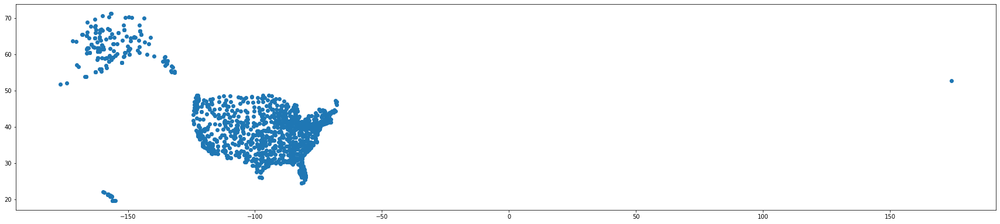

<AxesSubplot:>

In [0]:
fig, ax = plt.subplots(figsize=(30,30))
gdf_airport.plot(ax=ax)

Out[41]:

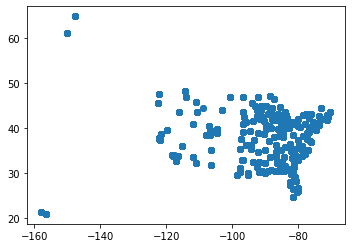

<AxesSubplot:>

In [0]:
gdf_dest_airport_6m.plot()

Out[53]:

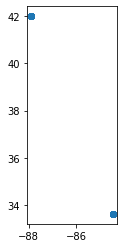

<AxesSubplot:>

In [0]:
gdf_origin_airport_6m.plot()

We could use of street map later for EDA

In [0]:
sample_map = folium.Map(location=[37.8721, -122.2578],   # lat, lon around which to center the map
                 tiles= "OpenStreetMap",
                 width="100%",                     # the width & height of the output map
                 height=300,                       # in pixels (int) or in percent of available space (str)
                 zoom_start=2)                    # the zoom level for the data to be displayed (3-20)

folium.GeoJson(gdf_airport).add_to(sample_map)
sample_map

Out[19]:

Make this Notebook Trusted to load map: File -> Trust Notebook <iframe src="about:blank" style="position:absolute;width:100%;height:100%;left:0;top:0;border:none !important;" data-html=%3C%21DOCTYPE%20html%3E%0A%3Chead%3E%20%20%20%20%0A%20%20%20%20%3Cmeta%20http-equiv%3D%22content-type%22%20content%3D%22text/html%3B%20charset%3DUTF-8%22%20/%3E%0A%20%20%20%20%0A%20%20%20%20%20%20%20%20%3Cscript%3E%0A%20%20%20%20%20%20%20%20%20%20%20%20L_NO_TOUCH%20%3D%20false%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20L_DISABLE_3D%20%3D%20false%3B%0A%20%20%20%20%20%20%20%20%3C/script%3E%0A%20%20%20%20%0A%20%20%20%20%3Cstyle%3Ehtml%2C%20body%20%7Bwidth%3A%20100%25%3Bheight%3A%20100%25%3Bmargin%3A%200%3Bpadding%3A%200%3B%7D%3C/style%3E%0A%20%20%20%20%3Cstyle%3E%23map%20%7Bposition%3Aabsolute%3Btop%3A0%3Bbottom%3A0%3Bright%3A0%3Bleft%3A0%3B%7D%3C/style%3E%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//cdn.jsdelivr.net/npm/leaflet%401.6.0/dist/leaflet.js%22%3E%3C/script%3E%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//code.jquery.com/jquery-1.12.4.min.js%22%3E%3C/script%3E%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//maxcdn.bootstrapcdn.com/bootstrap/3.2.0/js/bootstrap.min.js%22%3E%3C/script%3E%0A%20%20%20%20%3Cscript%20src%3D%22https%3A//cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js%22%3E%3C/script%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//cdn.jsdelivr.net/npm/leaflet%401.6.0/dist/leaflet.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//maxcdn.bootstrapcdn.com/bootstrap/3.2.0/css/bootstrap.min.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//maxcdn.bootstrapcdn.com/bootstrap/3.2.0/css/bootstrap-theme.min.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//maxcdn.bootstrapcdn.com/font-awesome/4.6.3/css/font-awesome.min.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css%22/%3E%0A%20%20%20%20%3Clink%20rel%3D%22stylesheet%22%20href%3D%22https%3A//cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css%22/%3E%0A%20%20%20%20%0A%20%20%20%20%20%20%20%20%20%20%20%20%3Cmeta%20name%3D%22viewport%22%20content%3D%22width%3Ddevice-width%2C%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20initial-scale%3D1.0%2C%20maximum-scale%3D1.0%2C%20user-scalable%3Dno%22%20/%3E%0A%20%20%20%20%20%20%20%20%20%20%20%20%3Cstyle%3E%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%23map_bffb7aef3afd473c89bee480df5d9966%20%7B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20position%3A%20relative%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20width%3A%20100.0%25%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20height%3A%20300.0px%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20left%3A%200.0%25%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20top%3A%200.0%25%3B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%7D%0A%20%20%20%20%20%20%20%20%20%20%20%20%3C/style%3E%0A%20%20%20%20%20%20%20%20%0A%3C/head%3E%0A%3Cbody%3E%20%20%20%20%0A%20%20%20%20%0A%20%20%20%20%20%20%20%20%20%20%20%20%3Cdiv%20class%3D%22folium-map%22%20id%3D%22map_bffb7aef3afd473c89bee480df5d9966%22%20%3E%3C/div%3E%0A%20%20%20%20%20%20%20%20%0A%3C/body%3E%0A%3Cscript%3E%20%20%20%20%0A%20%20%20%20%0A%20%20%20%20%20%20%20%20%20%20%20%20var%20map_bffb7aef3afd473c89bee480df5d9966%20%3D%20L.map%28%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%22map_bffb7aef3afd473c89bee480df5d9966%22%2C%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%7B%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20center%3A%20%5B37.8721%2C%20-122.2578%5D%2C%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20crs%3A%20L.CRS.EPSG3857%2C%0A%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20%20zoom%3A%202%2C%0A%20%20%20%20%20%20%

# 1. Explore Airline 6 months features

In [0]:
display(df_airlines_6m)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_TAIL_NUM,DIV3_WHEELS_OFF,DIV4_AIRPORT,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_WHEELS_ON,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,ORI_IATA,ORI_station_id,ORI_station_lat,ORI_station_lon,ORI_airport_lat,ORI_airport_lon,ORI_dist_airp_sta,ORI_Country,ORI_airport_type,DEST_IATA,DEST_station_id,DEST_station_lat,DEST_station_lon,DEST_airport_lat,DEST_airport_lon,DEST_dist_airp_sta,DEST_Country,DEST_airport_type
2015,2,4,1,3,2015-04-01,AA,19805,AA,N597AA,315,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,11298,1129804,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,929,919,-10.0,0.0,0.0,-1,0900-0959,14.0,933,1026,26.0,1100,1052,-8.0,0.0,0.0,-1,1100-1159,0.0,null,0.0,151.0,153.0,113.0,1.0,731.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,2,4,2015-04-02,AA,19805,AA,N456AA,315,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,11298,1129804,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,929,1042,73.0,73.0,1.0,4,0900-0959,20.0,1102,1155,17.0,1100,1212,72.0,72.0,1.0,4,1100-1159,0.0,null,0.0,151.0,150.0,113.0,1.0,731.0,3,72.0,0.0,0.0,0.0,0.0,921,19.0,19.0,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,3,5,2015-04-03,AA,19805,AA,N4YNAA,315,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,11298,1129804,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,929,926,-3.0,0.0,0.0,-1,0900-0959,22.0,948,1044,6.0,1100,1050,-10.0,0.0,0.0,-1,1100-1159,0.0,null,0.0,151.0,144.0,116.0,1.0,731.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,4,6,2015-04-04,AA,19805,AA,N481AA,315,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,11298,1129804,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,929,921,-8.0,0.0,0.0,-1,0900-0959,16.0,937,1032,30.0,1100,1102,2.0,2.0,0.0,0,1100-1159,0.0,null,0.0,151.0,161.0,115.0,1.0,731.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.695

## Which feature to choose for carrier? 

`OP_UNIQUE_CARRIER`
`OP_CARRIER_AIRLINE_ID`
`OP_CARRIER`

Findings - Any of the three could be chosen

In [0]:
df_airlines_6m.groupby(['OP_UNIQUE_CARRIER','OP_CARRIER_AIRLINE_ID','OP_CARRIER']).count().show()

+-----------------+---------------------+----------+------+
OP_UNIQUE_CARRIER|OP_CARRIER_AIRLINE_ID|OP_CARRIER| count|
+-----------------+---------------------+----------+------+
 DL| 19790| DL|122604|
 F9| 20436| F9| 4265|
 OO| 20304| OO| 22117|
 MQ| 20398| MQ| 34248|
 UA| 19977| UA| 32977|
 NK| 20416| NK| 6859|
 EV| 20366| EV| 55859|
 AA| 19805| AA| 28159|
 VX| 21171| VX| 652|
 AS| 19930| AS| 1066|
 US| 20355| US| 6391|
 B6| 20409| B6| 1164|
 WN| 19393| WN| 21466|
+-----------------+---------------------+----------+------+

## How does the distribution of carrier look like?

In [0]:
display(df_airlines_6m.groupby(['OP_UNIQUE_CARRIER']).count())

OP_UNIQUE_CARRIER,count
UA,32977
NK,6859
AA,28159
EV,55859
B6,1164
DL,122604
OO,22117
F9,4265
US,6391
MQ,34248


## Any possible relation between tail number and delay?

Findings: There is likely the ralation between specific tail number and delay

- Average ratio of delay in all the data: **22.39%**

- Average ratio of delay in top5-delayed tail number
  - N650MQ: **28.94%**
  - N620MQ: **35.82%**
  - N423SW: **30.94%**
  - N873AS: **21.57%**
  - N620MQ: **43.24%**

In [0]:
from pyspark.sql.functions import sum, col, desc
display(df_airlines_6m.filter(df_airlines_6m.DEP_DEL15 == 1).groupby(['TAIL_NUM']).count().sort(desc('count')))

#DEP_DEL15: Outcome variable

TAIL_NUM,count
N650MQ,101
N620MQ,101
N423SW,99
N873AS,96
N505MQ,96
N537MQ,95
N539MQ,94
N503MQ,93
N860AS,92
N498CA,92


In [0]:
# display(df_airlines_6m.filter(df_airlines_6m.TAIL_NUM == 'N650MQ').groupby(['DEP_DEL15']).count())
# display(df_airlines_6m.filter(df_airlines_6m.TAIL_NUM == 'N620MQ').groupby(['DEP_DEL15']).count())
# display(df_airlines_6m.filter(df_airlines_6m.TAIL_NUM == 'N423SW').groupby(['DEP_DEL15']).count())
display(df_airlines_6m.filter(df_airlines_6m.TAIL_NUM == 'N505MQ').groupby(['DEP_DEL15']).count())


DEP_DEL15,count
0.0,126
null,12
1.0,96


In [0]:
display(df_airlines_6m.filter(df_airlines_6m.TAIL_NUM == 'N505MQ').groupby(['DEP_DEL15']).count())

DEP_DEL15,count
0.0,126
null,12
1.0,96


In [0]:
display(df_airlines_6m.groupby(['DEP_DEL15']).count())

DEP_DEL15,count
0.0,256563
null,7260
1.0,74004


In [0]:
print(f'Average ratio of delay in all the data: {round((100*74004)/(256563+74004),2)}%')
print(f'Average ratio of delay in top5-delayed tail number(N650MQ): {round((100*101)/(248+101),2)}%')
print(f'Average ratio of delay in top5-delayed tail number(N620MQ): {round((100*101)/(181+101),2)}%')
print(f'Average ratio of delay in top5-delayed tail number(N423SW): {round((100*99)/(221+99),2)}%')
print(f'Average ratio of delay in top5-delayed tail number(N873AS): {round((100*96)/(349+96),2)}%')
print(f'Average ratio of delay in top5-delayed tail number(N620MQ): {round((100*96)/(126+96),2)}%')

Average ratio of delay in all the data: 22.39%
Average ratio of delay in top5-delayed tail number(N650MQ): 28.94%
Average ratio of delay in top5-delayed tail number(N620MQ): 35.82%
Average ratio of delay in top5-delayed tail number(N423SW): 30.94%
Average ratio of delay in top5-delayed tail number(N873AS): 21.57%
Average ratio of delay in top5-delayed tail number(N620MQ): 43.24%

## Any possible relation between flight number and delay?

Findings: There is likely the ralation between specific flight number and delay

- Average ratio of delay in all the data: **22.37%**

- Average ratio of delay in top5-delayed flight number
    - 241 : 26.94%
    - 219 : 39.78%
    - 968 : 60.34%
    - 853 : 45.83%
    - 425 : 40.82%
    
    241 has the largest number of flight records among all the flights(regardless of delay/on schedule). Therefore 241 has large number of delay simply because it has more records than others.

In [0]:
display(df_airlines_6m.filter(df_airlines_6m.DEP_DEL15 == 1).groupby(['OP_CARRIER_FL_NUM']).count().sort(desc('count')))



OP_CARRIER_FL_NUM,count
241,163
219,142
968,140
853,130
425,129
374,128
1290,122
903,121
112,117
1285,113


In [0]:
# display(df_airlines_6m.filter(df_airlines_6m.OP_CARRIER_FL_NUM == '241').groupby(['DEP_DEL15']).count())
# display(df_airlines_6m.filter(df_airlines_6m.OP_CARRIER_FL_NUM == '219').groupby(['DEP_DEL15']).count())
# display(df_airlines_6m.filter(df_airlines_6m.OP_CARRIER_FL_NUM == '968').groupby(['DEP_DEL15']).count())
# display(df_airlines_6m.filter(df_airlines_6m.OP_CARRIER_FL_NUM == '853').groupby(['DEP_DEL15']).count())
display(df_airlines_6m.filter(df_airlines_6m.OP_CARRIER_FL_NUM == '425').groupby(['DEP_DEL15']).count())

DEP_DEL15,count
0.0,187
1.0,129
null,4


In [0]:
print(f'Average ratio of delay in all the data: {round((100*74004)/(256563+74004),2)}%')
print(f'Average ratio of delay in top5-delayed flight number(241): {round((100*163)/(163+442),2)}%')
print(f'Average ratio of delay in top5-delayed flight number(219): {round((100*142)/(215+142),2)}%')
print(f'Average ratio of delay in top5-delayed flight number(968): {round((100*140)/(92+140),2)}%')
print(f'Average ratio of delay in top5-delayed flight number(853): {round((100*110)/(110+130),2)}%')
print(f'Average ratio of delay in top5-delayed flight number(425): {round((100*129)/(187+129),2)}%')

Average ratio of delay in all the data: 22.39%
Average ratio of delay in top5-delayed flight number(241): 26.94%
Average ratio of delay in top5-delayed flight number(219): 39.78%
Average ratio of delay in top5-delayed flight number(968): 60.34%
Average ratio of delay in top5-delayed flight number(853): 45.83%
Average ratio of delay in top5-delayed flight number(425): 40.82%

In [0]:
# total number of flight by flight number
display(df_airlines_6m.groupby(['OP_CARRIER_FL_NUM']).count().sort(desc('count')))


OP_CARRIER_FL_NUM,count
241,609
374,467
1693,429
231,414
1285,398
1612,397
1290,384
1463,364
219,362
675,361


## Which feature to choose for Origin/Destination airportID? 

`ORIGIN_AIRPORT_ID`
`ORIGIN_AIRPORT_SEQ_ID`
`ORIGIN`

- **Significant finding: The 6m dataset only covers ATL and ORD as an ORIGIN**. 
    - Therefore we do not need to filter by two airports.
    - Both airports have similar number of total flights in 6months(ATL:186,000 ORD:151,000)

- Other findings - Any of the three could be chosen

In [0]:
df_airlines_6m.groupby(['ORIGIN_AIRPORT_ID','ORIGIN_AIRPORT_SEQ_ID','ORIGIN']).count().show()

+-----------------+---------------------+------+------+
ORIGIN_AIRPORT_ID|ORIGIN_AIRPORT_SEQ_ID|ORIGIN| count|
+-----------------+---------------------+------+------+
 10397| 1039705| ATL|186135|
 13930| 1393003| ORD|151692|
+-----------------+---------------------+------+------+

## Are there trend in delay by destination? 

- Findings;
  - Some airports with large number of flights as a whole are likely to have more delay(Ex. LGA)
  - Howeveer, some specific ORIGIN/DESTINATION such as DEN and SFO are likely to have more delay then the average
  - When we look at combination of ORIGIN/DESTINATION, specific route such as ORD-SFO and ORD-DEN are more likely to have delay.
  - We might want to categorize route by the trend of delay?(Ex. 1.likely to delay 0.less likely to delay)

In [0]:
display(df_airlines_6m.filter(df_airlines_6m.DEP_DEL15 == 1).groupby(['DEST']).count().sort(desc('count')))

DEST,count
LGA,2582
DFW,1834
LAX,1827
DEN,1659
SFO,1640
BOS,1548
MSP,1516
MCO,1487
DCA,1468
PHL,1373


In [0]:
# display(df_airlines_6m.filter(df_airlines_6m.DEST == 'LGA').groupby(['DEP_DEL15']).count())
# display(df_airlines_6m.filter(df_airlines_6m.DEST == 'DFW').groupby(['DEP_DEL15']).count())
# display(df_airlines_6m.filter(df_airlines_6m.DEST == 'LAX').groupby(['DEP_DEL15']).count())
# display(df_airlines_6m.filter(df_airlines_6m.DEST == 'DEN').groupby(['DEP_DEL15']).count())
display(df_airlines_6m.filter(df_airlines_6m.DEST == 'SFO').groupby(['DEP_DEL15']).count())



DEP_DEL15,count
0.0,3558
null,70
1.0,1640


In [0]:
print(f'Average ratio of delay in all the data: {round((100*74004)/(256563+74004),2)}%')

print(f'Average ratio of delay in top5-delayed destination(LGA): {round((100*2582)/(6728+2582),2)}%')
print(f'Average ratio of delay in top5-delayed destination(DFW): {round((100*1834)/(6034+1834),2)}%')
print(f'Average ratio of delay in top5-delayed destination(LAX): {round((100*1827)/(1827+5053),2)}%')
print(f'Average ratio of delay in top5-delayed destination(DEN): {round((100*1659)/(1659+3933),2)}%')
print(f'Average ratio of delay in top5-delayed destination(SFO): {round((100*1640)/(1640+3558),2)}%')


Average ratio of delay in all the data: 22.39%
Average ratio of delay in top5-delayed destination(LGA): 27.73%
Average ratio of delay in top5-delayed destination(DFW): 23.31%
Average ratio of delay in top5-delayed destination(LAX): 26.56%
Average ratio of delay in top5-delayed destination(DEN): 29.67%
Average ratio of delay in top5-delayed destination(SFO): 31.55%

In [0]:
# total number of flight by destination
display(df_airlines_6m.groupby(['DEST']).count().sort(desc('count')))

DEST,count
LGA,9769
DFW,8060
LAX,6944
MCO,6862
DCA,6764
CLT,6104
MSP,5907
BOS,5874
PHL,5865
DEN,5648


In [0]:
# Find combinations of ORIGIN/DESTINATIONS that have more delay
display(df_airlines_6m.filter(df_airlines_6m.DEP_DEL15 == 1).groupby(['ORIGIN','DEST']).count().sort(desc('count')))

ORIGIN,DEST,count
ORD,LGA,1449
ORD,SFO,1252
ORD,LAX,1230
ORD,DFW,1157
ATL,LGA,1133
ORD,DEN,1090
ORD,MSP,1035
ORD,BOS,1008
ORD,ATL,872
ORD,LAS,812


In [0]:
# Compare with total number of flights
display(df_airlines_6m.groupby(['ORIGIN','DEST']).count().sort(desc('count')))

ORIGIN,DEST,count
ORD,LGA,5224
ATL,LGA,4545
ATL,MCO,4386
ORD,DFW,4122
ORD,LAX,4109
ATL,FLL,4070
ATL,DFW,3938
ATL,TPA,3742
ORD,SFO,3589
ATL,DCA,3490


## Does 6 months data include international flights?

Findings: all the flights are domestic flights(or at least the flights that could be linked to weather data)

In [0]:
display(df_airlines_6m.groupby(['DEST_Country']).count().sort(desc('count')))

DEST_Country,count
USA,277524
null,58495
PUERTO RICO,1364
VIRGIN ISL.,444


## Are there correlation in Air time and Delay time?
- No correlation between air time and delay time
- Longer flights are likely to have more delay

Out[40]:

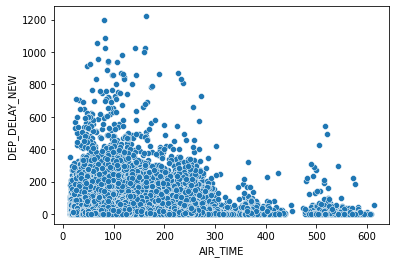

<AxesSubplot:xlabel='AIR_TIME', ylabel='DEP_DELAY_NEW'>

In [0]:
pdf_airlines_6m = df_airlines_6m.toPandas()
sns.scatterplot(data=pdf_airlines_6m, x="AIR_TIME", y="DEP_DELAY_NEW")

/databricks/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
 warnings.warn(

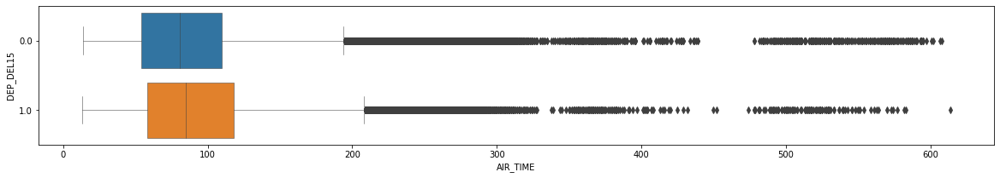

In [0]:
## BOX PLOT

fig, ax_ = plt.subplots(1, 1, figsize=(20,3))
y = pdf_airlines_6m['DEP_DEL15']
x = pdf_airlines_6m['AIR_TIME']
sns.boxplot(x, y, orient='h', linewidth=.5)

# ax_grid.invert_yaxis()
# fig.suptitle("Individual Features vs. Outcome (qualilty)", fontsize=15, y=0.9)
plt.show()

## Are there any trend by month?

### Code to add proportion of delay in the new column

In [0]:
display(df_airlines_6m.groupby(['MONTH','DEP_DEL15']).count().sort('month'))

MONTH,DEP_DEL15,count
1,0.0,39795
1,1.0,11887
1,null,1314
2,1.0,12848
2,null,2568
2,0.0,33762
3,null,944
3,1.0,11950
3,0.0,45989
4,null,579


In [0]:
display(df_airlines_6m.groupby(['MONTH','DEP_DEL15']).count().sort('month'))

MONTH,DEP_DEL15,count
1,0.0,39795
1,1.0,11887
1,null,1314
2,1.0,12848
2,null,2568
2,0.0,33762
3,null,944
3,1.0,11950
3,0.0,45989
4,null,579


In [0]:
display(df_airlines_6m.groupby(['MONTH','DEP_DEL15']).count().sort('month'))

MONTH,DEP_DEL15,count
1,0.0,39795
1,1.0,11887
1,null,1314
2,1.0,12848
2,null,2568
2,0.0,33762
3,null,944
3,1.0,11950
3,0.0,45989
4,null,579


In [0]:
display(df_airlines_6m.groupby(['MONTH','DEP_DEL15','ORIGIN']).count().sort('month'))

MONTH,DEP_DEL15,ORIGIN,count
1,1.0,ORD,7168
1,null,ATL,255
1,0.0,ORD,15257
1,null,ORD,1059
1,0.0,ATL,24538
1,1.0,ATL,4719
2,null,ORD,1650
2,0.0,ATL,21157
2,null,ATL,918
2,1.0,ORD,7557


## Are there any trend in delay by destination? 

- Detinations such as CLT or MIA are likely to have smaller ratio of delayed flights, regardless of the two ORIGIN 
- There seems to be common destinations that has smaller ratio of delayed flight such as CLT or MIA, regardless of the 

- Note: While ORD and ATL are the TOP3 airports with the largest number of flights in the US, flights between ORD<->ATL are not as large as assumed

### Ratio of delayed fights by combinations of ORIGIN/DESTINATIONS

- Extract Top 20 destinations with higher total number of flights

#### ORD to Top 20 Destinations

In [0]:
# find top 20 airport for total flight count
df_airlines_6m_3 = df_airlines_6m.filter(df_airlines_6m.ORIGIN == 'ORD')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .select(['DEST'])\

# convert to pandas
pdf_airlines_6m_3 = df_airlines_6m_3.toPandas()
# filter to top 20 airports 
band_list = [i for i in pdf_airlines_6m_3['DEST']][:20]
band_list

# Show proprotion of 
display(df_airlines_6m.filter(col('DEST').isin(band_list)==True)\
        .groupby(['DEST','DEP_DEL15'])\
        .count()\
        .sort(desc('count')))

DEST,DEP_DEL15,count
LGA,0.0,6728
DFW,0.0,6034
MCO,0.0,5312
DCA,0.0,5097
LAX,0.0,5053
CLT,0.0,5026
PHL,0.0,4348
MSP,0.0,4308
BOS,0.0,4121
MIA,0.0,4073


In [0]:
# find top 20 airport for total flight count
df_airlines_6m_3 = df_airlines_6m.filter(df_airlines_6m.ORIGIN == 'ORD')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .select(['DEST'])\

# convert to pandas
pdf_airlines_6m_3 = df_airlines_6m_3.toPandas()
# filter to top 20 airports 
band_list = [i for i in pdf_airlines_6m_3['DEST']][:20]
band_list

# Show proprotion of 
display(df_airlines_6m.filter(col('DEST').isin(band_list)==True)\
        .groupby(['DEST','DEP_DEL15'])\
        .count()\
        .sort(desc('count')))

DEST,DEP_DEL15,count
LGA,0.0,6728
DFW,0.0,6034
MCO,0.0,5312
DCA,0.0,5097
LAX,0.0,5053
CLT,0.0,5026
PHL,0.0,4348
MSP,0.0,4308
BOS,0.0,4121
MIA,0.0,4073


#### Total delayed flights by destination(ORIGIN == ORD)

In [0]:
# find top 20 airport for total flight count
df_airlines_6m_3 = df_airlines_6m.filter(df_airlines_6m.ORIGIN == 'ORD')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .select(['DEST'])\

# convert to pandas
pdf_airlines_6m_3 = df_airlines_6m_3.toPandas()
# filter to top 20 airports 
band_list = [i for i in pdf_airlines_6m_3['DEST']][:20]
band_list

# Show proprotion of 
display(df_airlines_6m.filter(col('DEST').isin(band_list)==True)\
        .filter(df_airlines_6m.DEP_DEL15 == 1)\
        .groupby(['DEST','DEP_DEL15'])\
        .count()\
        .sort(desc('count')))

DEST,DEP_DEL15,count
LGA,1.0,2582
DFW,1.0,1834
LAX,1.0,1827
DEN,1.0,1659
SFO,1.0,1640
BOS,1.0,1548
MSP,1.0,1516
MCO,1.0,1487
DCA,1.0,1468
PHL,1.0,1373


### ATL to Top 20 Destinations

In [0]:
# find top 20 airport for total flight count
df_airlines_6m_3 = df_airlines_6m.filter(df_airlines_6m.ORIGIN == 'ATL')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .select(['DEST'])\

# convert to pandas
pdf_airlines_6m_3 = df_airlines_6m_3.toPandas()
# filter to top 20 airports 
band_list = [i for i in pdf_airlines_6m_3['DEST']][:20]
band_list

# Show proprotion of 
display(df_airlines_6m.filter(col('DEST').isin(band_list)==True)\
        .groupby(['DEST','DEP_DEL15'])\
        .count()\
        .sort(desc('count')))

DEST,DEP_DEL15,count
LGA,0.0,6728
DFW,0.0,6034
MCO,0.0,5312
DCA,0.0,5097
LAX,0.0,5053
CLT,0.0,5026
FLL,0.0,4416
PHL,0.0,4348
MSP,0.0,4308
BOS,0.0,4121


In [0]:
# find top 20 airport for total flight count
df_airlines_6m_3 = df_airlines_6m.filter(df_airlines_6m.ORIGIN == 'ATL')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .select(['DEST'])\

# convert to pandas
pdf_airlines_6m_3 = df_airlines_6m_3.toPandas()
# filter to top 20 airports 
band_list = [i for i in pdf_airlines_6m_3['DEST']][:20]
band_list

# Show proprotion of 
display(df_airlines_6m.filter(col('DEST').isin(band_list)==True)\
        .groupby(['DEST','DEP_DEL15'])\
        .count()\
        .sort(desc('count')))

DEST,DEP_DEL15,count
LGA,0.0,6728
DFW,0.0,6034
MCO,0.0,5312
DCA,0.0,5097
LAX,0.0,5053
CLT,0.0,5026
FLL,0.0,4416
PHL,0.0,4348
MSP,0.0,4308
BOS,0.0,4121


In [0]:
# find top 20 airport for total flight count
df_airlines_6m_3 = df_airlines_6m.filter(df_airlines_6m.ORIGIN == 'ATL')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .select(['DEST'])\

# convert to pandas
pdf_airlines_6m_3 = df_airlines_6m_3.toPandas()
# filter to top 20 airports 
band_list = [i for i in pdf_airlines_6m_3['DEST']][:20]
band_list

# Show proprotion of 
display(df_airlines_6m.filter(col('DEST').isin(band_list)==True)\
        .filter(df_airlines_6m.DEP_DEL15 == 1)\
        .groupby(['DEST','DEP_DEL15'])\
        .count()\
        .sort(desc('count')))

DEST,DEP_DEL15,count
LGA,1.0,2582
DFW,1.0,1834
LAX,1.0,1827
DEN,1.0,1659
BOS,1.0,1548
MSP,1.0,1516
MCO,1.0,1487
DCA,1.0,1468
PHL,1.0,1373
EWR,1.0,1302


### Is delay more likely to occur in airports with larger number of flights?

In [0]:
# count total of flight by airport(ORIGIN= ORD)
df_airlines_6m_4 = df_airlines_6m.filter(df_airlines_6m.ORIGIN == 'ORD')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_all")

# count number of delay in each airport(ORIGIN= ORD)
df_airlines_6m_4_delay = df_airlines_6m.filter(df_airlines_6m.ORIGIN == 'ORD')\
        .filter(df_airlines_6m.DEP_DEL15 == '1')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_delay")
    
# join two tables
df_airlines_6m_4_ratio = df_airlines_6m_4.join(df_airlines_6m_4_delay, df_airlines_6m_4.DEST == df_airlines_6m_4_delay.DEST)
display(df_airlines_6m_4_ratio)

DEST,count_all,DEST,count_delay
MSY,844,MSY,259
SNA,1100,SNA,249
GRB,1507,GRB,290
GRR,1532,GRR,357
PVD,241,PVD,66
GSO,249,GSO,30
MYR,139,MYR,39
OAK,181,OAK,48
FAR,1117,FAR,253
MSN,1737,MSN,364


Out[53]:

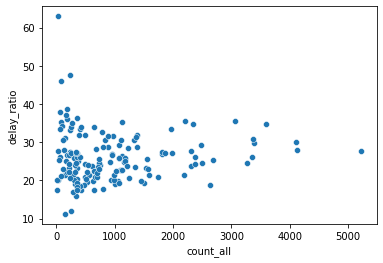

<AxesSubplot:xlabel='count_all', ylabel='delay_ratio'>

In [0]:
# add column that shows ratio
df_airlines_6m_4_ratio = df_airlines_6m_4_ratio.withColumn('delay_ratio', 100*col('count_delay') / col('count_all'))

# create a scatter plot of total number of flight and ratio of delayed flights
pdf_airlines_6m_4_ratio = df_airlines_6m_4_ratio.select(['count_all','delay_ratio']).toPandas()
sns.scatterplot(data=pdf_airlines_6m_4_ratio, x="count_all", y="delay_ratio")

Out[54]:

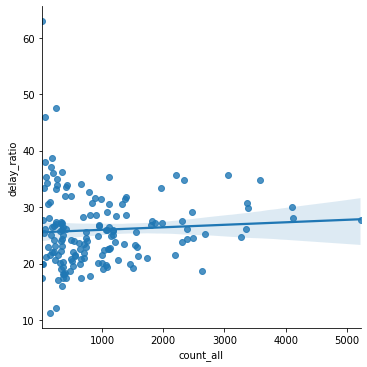

<seaborn.axisgrid.FacetGrid at 0x7f77eb9b9460>

In [0]:
sns.lmplot(data=pdf_airlines_6m_4_ratio, x="count_all", y="delay_ratio")

In [0]:
# count total of flight by airport(ORIGIN= ATL)
df_airlines_6m_4 = df_airlines_6m.filter(df_airlines_6m.ORIGIN == 'ATL')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_all")

# count number of delay in each airport(ORIGIN= ATL)
df_airlines_6m_4_delay = df_airlines_6m.filter(df_airlines_6m.ORIGIN == 'ATL')\
        .filter(df_airlines_6m.DEP_DEL15 == '1')\
        .groupby(['DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_delay")
    
# join two tables
df_airlines_6m_4_ratio = df_airlines_6m_4.join(df_airlines_6m_4_delay, df_airlines_6m_4.DEST == df_airlines_6m_4_delay.DEST)
display(df_airlines_6m_4_ratio)

DEST,count_all,DEST,count_delay
MSY,2921,MSY,485
SNA,525,SNA,100
GRB,213,GRB,56
GRR,715,GRR,77
GSO,1440,GSO,286
PVD,511,PVD,69
MYR,797,MYR,136
MSN,464,MSN,69
FSM,396,FSM,78
FAR,21,FAR,7


Out[56]:

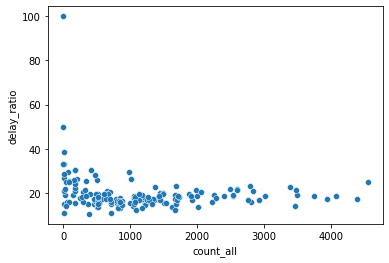

<AxesSubplot:xlabel='count_all', ylabel='delay_ratio'>

In [0]:
# add column that shows ratio
df_airlines_6m_4_ratio = df_airlines_6m_4_ratio.withColumn('delay_ratio', 100*col('count_delay') / col('count_all'))

# create a scatter plot of total number of flight and ratio of delayed flights
pdf_airlines_6m_4_ratio = df_airlines_6m_4_ratio.select(['count_all','delay_ratio']).toPandas()
sns.scatterplot(data=pdf_airlines_6m_4_ratio, x="count_all", y="delay_ratio")

Out[57]:

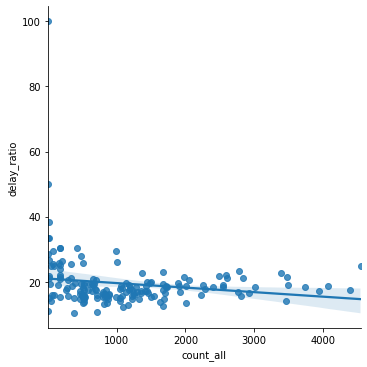

<seaborn.axisgrid.FacetGrid at 0x7f77e9806fd0>

In [0]:
sns.lmplot(data=pdf_airlines_6m_4_ratio, x="count_all", y="delay_ratio")

# 2. More preprocessing on dataset

## Create dataset for graph analysis

Jan-March data

In [0]:
# count total of flight by airport(ORIGIN= ATL)
df_airlines_6m_4 = df_airlines_6m.filter(df_airlines_6m.MONTH <= '3')\
        .groupby(['ORIGIN','DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_all")

# count number of delay in each airport(ORIGIN= ATL)
df_airlines_6m_4_delay = df_airlines_6m.filter(df_airlines_6m.MONTH <= '3')\
        .filter(df_airlines_6m.DEP_DEL15 == '1')\
        .groupby(['ORIGIN','DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_delay")\
        .withColumnRenamed("ORIGIN","ORIGIN2")\
        .withColumnRenamed("DEST","DEST2")
  
    
# join two tables
df_airlines_6m_4_ratio = df_airlines_6m_4.join(df_airlines_6m_4_delay, (df_airlines_6m_4.DEST == df_airlines_6m_4_delay.DEST2) & (df_airlines_6m_4.ORIGIN == df_airlines_6m_4_delay.ORIGIN2))
display(df_airlines_6m_4_ratio)

ORIGIN,DEST,count_all,ORIGIN2,DEST2,count_delay
ATL,GSP,662,ATL,GSP,113
ORD,PDX,338,ORD,PDX,104
ATL,HDN,82,ATL,HDN,21
ORD,FWA,591,ORD,FWA,145
ORD,BUF,342,ORD,BUF,104
ORD,CAE,169,ORD,CAE,44
ORD,MYR,48,ORD,MYR,12
ATL,ALB,253,ATL,ALB,46
ATL,SRQ,552,ATL,SRQ,65
ATL,GRB,125,ATL,GRB,29


In [0]:
# add column that shows ratio
df_airlines_6m_4_ratio = df_airlines_6m_4_ratio.withColumn('delay_ratio', col('count_delay') / col('count_all'))
display(df_airlines_6m_4_ratio.select(['ORIGIN','DEST','delay_ratio']))

ORIGIN,DEST,delay_ratio
ATL,GSP,0.17069486404833836
ORD,PDX,0.3076923076923077
ATL,HDN,0.25609756097560976
ORD,FWA,0.24534686971235195
ORD,BUF,0.30409356725146197
ORD,CAE,0.2603550295857988
ORD,MYR,0.25
ATL,ALB,0.18181818181818182
ATL,SRQ,0.11775362318840579
ATL,GRB,0.232


In [0]:
# store file to blob
airlines6m_for_graph_jan_mar_0313 = df_airlines_6m_4_ratio.select(['ORIGIN','DEST','delay_ratio'])
airlines6m_for_graph_jan_mar_0313.write.parquet(f"{blob_url}/airlines6m_for_graph_jan_mar_0313")

April-June

In [0]:
# count total of flight by airport(ORIGIN= ATL)
df_airlines_6m_5 = df_airlines_6m.filter(df_airlines_6m.MONTH >= '4')\
        .groupby(['ORIGIN','DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_all")

# count number of delay in each airport(ORIGIN= ATL)
df_airlines_6m_5_delay = df_airlines_6m.filter(df_airlines_6m.MONTH >= '4')\
        .filter(df_airlines_6m.DEP_DEL15 == '1')\
        .groupby(['ORIGIN','DEST'])\
        .count()\
        .sort(desc('count'))\
        .withColumnRenamed("count","count_delay")\
        .withColumnRenamed("ORIGIN","ORIGIN2")\
        .withColumnRenamed("DEST","DEST2")
  
    
# join two tables
df_airlines_6m_5_ratio = df_airlines_6m_5.join(df_airlines_6m_5_delay, (df_airlines_6m_5.DEST == df_airlines_6m_5_delay.DEST2) & (df_airlines_6m_5.ORIGIN == df_airlines_6m_5_delay.ORIGIN2))
display(df_airlines_6m_5_ratio)

# # add column that shows ratio
df_airlines_6m_5_ratio = df_airlines_6m_5_ratio.withColumn('delay_ratio', col('count_delay') / col('count_all'))
display(df_airlines_6m_5_ratio.select(['ORIGIN','DEST','delay_ratio']))

ORIGIN,DEST,count_all,ORIGIN2,DEST2,count_delay
ATL,GSP,687,ATL,GSP,120
ORD,PDX,643,ORD,PDX,205
ORD,FWA,665,ORD,FWA,113
ORD,CAE,163,ORD,CAE,30
ORD,BUF,614,ORD,BUF,153
ORD,MYR,91,ORD,MYR,27
ATL,ALB,256,ATL,ALB,36
ATL,GRB,88,ATL,GRB,27
ATL,SRQ,544,ATL,SRQ,70
ATL,LGA,2383,ATL,LGA,587


ORIGIN,DEST,delay_ratio
ATL,GSP,0.17467248908296942
ORD,PDX,0.3188180404354588
ORD,FWA,0.1699248120300752
ORD,CAE,0.18404907975460122
ORD,BUF,0.249185667752443
ORD,MYR,0.2967032967032967
ATL,ALB,0.140625
ATL,GRB,0.3068181818181818
ATL,SRQ,0.12867647058823528
ATL,LGA,0.2463281577843055


In [0]:
# store file to blob
airlines6m_for_graph_apr_june_0313 = df_airlines_6m_5_ratio.select(['ORIGIN','DEST','delay_ratio'])
airlines6m_for_graph_apr_june_0313.write.parquet(f"{blob_url}/airlines6m_for_graph_apr_june_0313")

## Update airlines_6months

### Drop diverted flights and overlapped features(Ex. )

In [0]:
display(df_airlines_6m)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_TAIL_NUM,DIV3_WHEELS_OFF,DIV4_AIRPORT,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_WHEELS_ON,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,ORI_IATA,ORI_station_id,ORI_station_lat,ORI_station_lon,ORI_airport_lat,ORI_airport_lon,ORI_dist_airp_sta,ORI_Country,ORI_airport_type,DEST_IATA,DEST_station_id,DEST_station_lat,DEST_station_lon,DEST_airport_lat,DEST_airport_lon,DEST_dist_airp_sta,DEST_Country,DEST_airport_type
2015,2,4,1,3,2015-04-01,AA,19805,AA,N597AA,315,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,11298,1129804,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,929,919,-10.0,0.0,0.0,-1,0900-0959,14.0,933,1026,26.0,1100,1052,-8.0,0.0,0.0,-1,1100-1159,0.0,null,0.0,151.0,153.0,113.0,1.0,731.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,2,4,2015-04-02,AA,19805,AA,N456AA,315,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,11298,1129804,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,929,1042,73.0,73.0,1.0,4,0900-0959,20.0,1102,1155,17.0,1100,1212,72.0,72.0,1.0,4,1100-1159,0.0,null,0.0,151.0,150.0,113.0,1.0,731.0,3,72.0,0.0,0.0,0.0,0.0,921,19.0,19.0,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,3,5,2015-04-03,AA,19805,AA,N4YNAA,315,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,11298,1129804,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,929,926,-3.0,0.0,0.0,-1,0900-0959,22.0,948,1044,6.0,1100,1050,-10.0,0.0,0.0,-1,1100-1159,0.0,null,0.0,151.0,144.0,116.0,1.0,731.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,4,6,2015-04-04,AA,19805,AA,N481AA,315,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,11298,1129804,30194,DFW,"Dallas/Fort Worth, TX",TX,48,Texas,74,929,921,-8.0,0.0,0.0,-1,0900-0959,16.0,937,1032,30.0,1100,1102,2.0,2.0,0.0,0,1100-1159,0.0,null,0.0,151.0,161.0,115.0,1.0,731.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.695

In [0]:
df_airlines_6m.columns

Out[18]: ['YEAR',
 'QUARTER',
 'MONTH',
 'DAY_OF_MONTH',
 'DAY_OF_WEEK',
 'FL_DATE',
 'OP_UNIQUE_CARRIER',
 'OP_CARRIER_AIRLINE_ID',
 'OP_CARRIER',
 'TAIL_NUM',
 'OP_CARRIER_FL_NUM',
 'ORIGIN_AIRPORT_ID',
 'ORIGIN_AIRPORT_SEQ_ID',
 'ORIGIN_CITY_MARKET_ID',
 'ORIGIN',
 'ORIGIN_CITY_NAME',
 'ORIGIN_STATE_ABR',
 'ORIGIN_STATE_FIPS',
 'ORIGIN_STATE_NM',
 'ORIGIN_WAC',
 'DEST_AIRPORT_ID',
 'DEST_AIRPORT_SEQ_ID',
 'DEST_CITY_MARKET_ID',
 'DEST',
 'DEST_CITY_NAME',
 'DEST_STATE_ABR',
 'DEST_STATE_FIPS',
 'DEST_STATE_NM',
 'DEST_WAC',
 'CRS_DEP_TIME',
 'DEP_TIME',
 'DEP_DELAY',
 'DEP_DELAY_NEW',
 'DEP_DEL15',
 'DEP_DELAY_GROUP',
 'DEP_TIME_BLK',
 'TAXI_OUT',
 'WHEELS_OFF',
 'WHEELS_ON',
 'TAXI_IN',
 'CRS_ARR_TIME',
 'ARR_TIME',
 'ARR_DELAY',
 'ARR_DELAY_NEW',
 'ARR_DEL15',
 'ARR_DELAY_GROUP',
 'ARR_TIME_BLK',
 'CANCELLED',
 'CANCELLATION_CODE',
 'DIVERTED',
 'CRS_ELAPSED_TIME',
 'ACTUAL_ELAPSED_TIME',
 'AIR_TIME',
 'FLIGHTS',
 'DISTANCE',
 'DISTANCE_GROUP',
 'CARRIER_DELAY',
 'WEATHER_DELAY',
 'NAS_DELAY',
 'SECURITY_DELAY',
 'LATE_AIRCRAFT_DELAY',
 'FIRST_DEP_TIME',
 'TOTAL_ADD_GTIME',
 'LONGEST_ADD_GTIME',
 'DIV_AIRPORT_LANDINGS',
 'DIV_REACHED_DEST',
 'DIV_ACTUAL_ELAPSED_TIME',
 'DIV_ARR_DELAY',
 'DIV_DISTANCE',
 'DIV1_AIRPORT',
 'DIV1_AIRPORT_ID',
 'DIV1_AIRPORT_SEQ_ID',
 'DIV1_WHEELS_ON',
 'DIV1_TOTAL_GTIME',
 'DIV1_LONGEST_GTIME',
 'DIV1_WHEELS_OFF',
 'DIV1_TAIL_NUM',
 'DIV2_TAIL_NUM',
 'DIV3_WHEELS_OFF',
 'DIV4_AIRPORT',
 'DIV4_AIRPORT_SEQ_ID',
 'DIV4_WHEELS_ON',
 'DIV4_TOTAL_GTIME',
 'DIV4_LONGEST_GTIME',
 'DIV4_WHEELS_OFF',
 'DIV4_TAIL_NUM',
 'DIV5_AIRPORT',
 'DIV5_AIRPORT_ID',
 'DIV5_WHEELS_ON',
 'DIV5_LONGEST_GTIME',
 'DIV5_WHEELS_OFF',
 'ORI_IATA',
 'ORI_station_id',
 'ORI_station_lat',
 'ORI_station_lon',
 'ORI_airport_lat',
 'ORI_airport_lon',
 'ORI_dist_airp_sta',
 'ORI_Country',
 'ORI_airport_type',
 'DEST_IATA',
 'DEST_station_id',
 'DEST_station_lat',
 'DEST_station_lon',
 'DEST_airport_lat',
 'DEST_airport_lon',
 'DEST_dist_airp_sta',
 'DEST_Country',
 'DEST_airport_type']

In [0]:
columns_to_drop = ['OP_CARRIER_AIRLINE_ID','OP_CARRIER','ORIGIN_AIRPORT_ID','ORIGIN_AIRPORT_SEQ_ID','ORIGIN_CITY_MARKET_ID','DEST_AIRPORT_ID','DEST_AIRPORT_SEQ_ID','DEST_CITY_MARKET_ID',
                  'ORIGIN_CITY_NAME','ORIGIN_STATE_FIPS','ORIGIN_STATE_NM','DEST_CITY_NAME','DEST_STATE_FIPS','DEST_STATE_NM','DIV_AIRPORT_LANDINGS','DIV_REACHED_DEST',                 'DIV_ACTUAL_ELAPSED_TIME', 'DIV_ARR_DELAY', 'DIV_DISTANCE', 'DIV1_AIRPORT', 'DIV1_AIRPORT_ID', 'DIV1_AIRPORT_SEQ_ID', 'DIV1_WHEELS_ON', 'DIV1_TOTAL_GTIME', 'DIV1_LONGEST_GTIME', 'DIV1_WHEELS_OFF','DIV1_TAIL_NUM', 'DIV2_TAIL_NUM', 'DIV3_WHEELS_OFF', 'DIV4_AIRPORT', 'DIV4_AIRPORT_SEQ_ID', 'DIV4_WHEELS_ON', 'DIV4_TOTAL_GTIME', 'DIV4_LONGEST_GTIME', 'DIV4_WHEELS_OFF', 'DIV4_TAIL_NUM', 'DIV5_AIRPORT', 'DIV5_AIRPORT_ID', 'DIV5_WHEELS_ON', 'DIV5_LONGEST_GTIME', 'DIV5_WHEELS_OFF']

df_airlines_6m_0315 = df_airlines_6m.drop(*columns_to_drop)
df_airlines_3m_0315 = df_airlines_3m.drop(*columns_to_drop)
# df = df.drop

In [0]:
display(df_airlines_6m_0315)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,ORIGIN_STATE_ABR,ORIGIN_WAC,DEST,DEST_STATE_ABR,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,ORI_IATA,ORI_station_id,ORI_station_lat,ORI_station_lon,ORI_airport_lat,ORI_airport_lon,ORI_dist_airp_sta,ORI_Country,ORI_airport_type,DEST_IATA,DEST_station_id,DEST_station_lat,DEST_station_lon,DEST_airport_lat,DEST_airport_lon,DEST_dist_airp_sta,DEST_Country,DEST_airport_type
2015,2,4,1,3,2015-04-01,AA,N597AA,315,ATL,GA,34,DFW,TX,74,929,919,-10.0,0.0,0.0,-1,0900-0959,14.0,933,1026,26.0,1100,1052,-8.0,0.0,0.0,-1,1100-1159,0.0,null,0.0,151.0,153.0,113.0,1.0,731.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,2,4,2015-04-02,AA,N456AA,315,ATL,GA,34,DFW,TX,74,929,1042,73.0,73.0,1.0,4,0900-0959,20.0,1102,1155,17.0,1100,1212,72.0,72.0,1.0,4,1100-1159,0.0,null,0.0,151.0,150.0,113.0,1.0,731.0,3,72.0,0.0,0.0,0.0,0.0,921,19.0,19.0,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,3,5,2015-04-03,AA,N4YNAA,315,ATL,GA,34,DFW,TX,74,929,926,-3.0,0.0,0.0,-1,0900-0959,22.0,948,1044,6.0,1100,1050,-10.0,0.0,0.0,-1,1100-1159,0.0,null,0.0,151.0,144.0,116.0,1.0,731.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,4,6,2015-04-04,AA,N481AA,315,ATL,GA,34,DFW,TX,74,929,921,-8.0,0.0,0.0,-1,0900-0959,16.0,937,1032,30.0,1100,1102,2.0,2.0,0.0,0,1100-1159,0.0,null,0.0,151.0,161.0,115.0,1.0,731.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,5,7,2015-04-05,AA,N488AA,315,ATL,GA,34,DFW,TX,74,929,928,-1.0,0.0,0.0,-1,0900-0959,10.0,938,1046,14.0,1100,1100,0.0,0.0,0.0,0,1100-1159,0.0,null,0.0,151.0,152.0,128.0,1.0,731.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,6,1,2015-04-06,AA,N4XEAA,315,ATL,GA,34,DFW,TX,74,929,921,-8.0,0.0,0.0,-1,0900-0959,11.0,932,1036,24.0,1100,1100,0.0,0.0,0.0,0,1100-1159,0.0,null,0.0,151.0,159.0,124.0,1.0,731.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,7,2,2015-04-07,AA,N436AA,315,ATL,GA,34,DFW,TX,74,929,920,-9.0,0.0,0.0,-1,0900-0959,21.0,941,1042,12.0,1100,1054,-6.0,0.0,0.0,-1,1100-1159,0.0,null,0.0,151.0,154.0,121.0,1.0,731.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,8,3,2015-04-08,AA,N4XKAA,315,ATL,GA,34,DFW,TX,74,929,925,-4.0,0.0,0.0,-1,0900-0959,12.0,937,1031,20.0,1100,1051,-9.0,0.0,0.0,-1,1100-1159,0.0,null,0.0,151.0,146.0,114.0,1.0,731.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,DFW,72259003927,32.898,-97.019,32.896,-97.037,1.6952163852654205,USA,USA
2015,2,4,9,4,2015-04-09,AA,N597AA,315,ATL,GA,34,DFW,TX,74,929,930,1.0,1.0,0.0,0,0900-0959,29.0,959,1055,19.0,1100,1114,14.0,14.0,0.

In [0]:
display(df_airlines_3m_0315)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,ORIGIN_STATE_ABR,ORIGIN_WAC,DEST,DEST_STATE_ABR,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,ORI_IATA,ORI_station_id,ORI_station_lat,ORI_station_lon,ORI_airport_lat,ORI_airport_lon,ORI_dist_airp_sta,ORI_Country,ORI_airport_type,DEST_IATA,DEST_station_id,DEST_station_lat,DEST_station_lon,DEST_airport_lat,DEST_airport_lon,DEST_dist_airp_sta,DEST_Country,DEST_airport_type
2015,1,2,1,7,2015-02-01,AA,N016AA,349,ATL,GA,34,MIA,FL,33,2105,2116,11.0,11.0,0.0,0,2100-2159,12.0,2128,2252,9.0,2300,2301,1.0,1.0,0.0,0,2300-2359,0.0,null,0.0,115.0,105.0,84.0,1.0,594.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,MIA,72202012839,25.788,-80.317,25.793,-80.291,2.661806337015443,USA,USA
2015,1,2,2,1,2015-02-02,AA,N019AA,349,ATL,GA,34,MIA,FL,33,2105,2056,-9.0,0.0,0.0,-1,2100-2159,24.0,2120,2242,6.0,2300,2248,-12.0,0.0,0.0,-1,2300-2359,0.0,null,0.0,115.0,112.0,82.0,1.0,594.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,MIA,72202012839,25.788,-80.317,25.793,-80.291,2.661806337015443,USA,USA
2015,1,2,3,2,2015-02-03,AA,N008AA,349,ATL,GA,34,MIA,FL,33,2105,2058,-7.0,0.0,0.0,-1,2100-2159,19.0,2117,2243,7.0,2300,2250,-10.0,0.0,0.0,-1,2300-2359,0.0,null,0.0,115.0,112.0,86.0,1.0,594.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,MIA,72202012839,25.788,-80.317,25.793,-80.291,2.661806337015443,USA,USA
2015,1,2,4,3,2015-02-04,AA,N024AA,349,ATL,GA,34,MIA,FL,33,2105,2057,-8.0,0.0,0.0,-1,2100-2159,23.0,2120,2245,3.0,2300,2248,-12.0,0.0,0.0,-1,2300-2359,0.0,null,0.0,115.0,111.0,85.0,1.0,594.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,MIA,72202012839,25.788,-80.317,25.793,-80.291,2.661806337015443,USA,USA
2015,1,2,6,5,2015-02-06,AA,N006AA,349,ATL,GA,34,MIA,FL,33,2105,2057,-8.0,0.0,0.0,-1,2100-2159,25.0,2122,2242,5.0,2300,2247,-13.0,0.0,0.0,-1,2300-2359,0.0,null,0.0,115.0,110.0,80.0,1.0,594.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,MIA,72202012839,25.788,-80.317,25.793,-80.291,2.661806337015443,USA,USA
2015,1,2,7,6,2015-02-07,AA,N012AA,349,ATL,GA,34,MIA,FL,33,2105,2058,-7.0,0.0,0.0,-1,2100-2159,12.0,2110,2240,8.0,2300,2248,-12.0,0.0,0.0,-1,2300-2359,0.0,null,0.0,115.0,110.0,90.0,1.0,594.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,MIA,72202012839,25.788,-80.317,25.793,-80.291,2.661806337015443,USA,USA
2015,1,2,8,7,2015-02-08,AA,N027AA,349,ATL,GA,34,MIA,FL,33,2105,2054,-11.0,0.0,0.0,-1,2100-2159,26.0,2120,2242,4.0,2300,2246,-14.0,0.0,0.0,-1,2300-2359,0.0,null,0.0,115.0,112.0,82.0,1.0,594.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,MIA,72202012839,25.788,-80.317,25.793,-80.291,2.661806337015443,USA,USA
2015,1,2,9,1,2015-02-09,AA,N024AA,349,ATL,GA,34,MIA,FL,33,2105,2058,-7.0,0.0,0.0,-1,2100-2159,17.0,2115,2244,6.0,2300,2250,-10.0,0.0,0.0,-1,2300-2359,0.0,null,0.0,115.0,112.0,89.0,1.0,594.0,3,null,null,null,null,null,null,null,null,ATL,72219013874,33.63,-84.442,33.64,-84.427,1.7790127980301214,USA,USA,MIA,72202012839,25.788,-80.317,25.793,-80.291,2.661806337015443,USA,USA
2015,1,2,10,2,2015-02-10,AA,N019AA,349,ATL,GA,34,MIA,FL,33,2105,2051,-14.0,0.0,0.0,-1,2100-2159,16.0,2107,2225,7.0,23

In [0]:
df_airlines_6m_0315.write.parquet(f"{blob_url}/air6m_join_stations_0316_filtered")
df_airlines_3m_0315.write.parquet(f"{blob_url}/air3m_join_stations_0316_filtered")

### Add datetime column
- Departure time in origin & Arrival time in destination
- Scheduled time & actual time

### Add UTC time to four columns added above

d 

# APPENDIX

## Reference code from HW4

In [0]:
# CORR
# # plot heatmap for correlations matrix - RUN THIS CELL AS IS
# corr = sample_df[FIELDS[:-1]].corr()
# fig, ax = plt.subplots(figsize=(11, 9))
# mask = np.zeros_like(corr, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True
# cmap = sns.diverging_palette(240, 10, as_cmap=True)
# sns.heatmap(corr, mask=mask, cmap=cmap, center=0, linewidths=.5)
# plt.title("Correlations between features.")
# plt.show()


In [0]:
# Histogram
# # part a - take a 1000 point sample for EDA (RUN THIS CELL AS IS)
# sample = np.array(trainRDDCached.map(lambda x: np.append(x[0], [x[1]]))
#                                 .takeSample(False, 1000))
# sample_df = pd.DataFrame(np.array(sample), columns = FIELDS)

# # part a - take a look at histograms for each feature (RUN THIS CELL AS IS)
# sample_df[FIELDS[:-1]].hist(figsize=(15,15), bins=15)
# plt.show()




In [0]:
## BOX PLOT

# # part b -  plot boxplots of each feature vs. the outcome (RUN THIS CELL AS IS)
# fig, ax_grid = plt.subplots(4, 3, figsize=(15,15))
# y = sample_df['quality']
# for idx, feature in enumerate(FIELDS[:-1]):
#     x = sample_df[feature]
#     sns.boxplot(x, y, ax=ax_grid[idx//3][idx%3], orient='h', linewidth=.5)
#     ax_grid[idx//3][idx%3].invert_yaxis()
# fig.suptitle("Individual Features vs. Outcome (qualilty)", fontsize=15, y=0.9)
# plt.show()

## Useful functions in Spark

In [0]:
# udf in Pyspark
# from pyspark.sql.functions import udf,col
# from pyspark.sql.types import StringType

# # define function
# def whetherUS(x):
#   if x == 'USA':
#     return 'USA'
#   else:
#     return 'OVERSEAS'

# # add column
# udf_whetherUS = udf(lambda x:whetherUS(x),StringType() )

# # execute "apply" in Pyspark and add a new feature
# nearest_stations_v2 = nearest_stations_with_country\
#                              .withColumn("airport_type",udf_whetherUS(col("Country")))\
#                              .distinct()
# display(nearest_stations_v2)